In [ ]:
#Importing the required modules

In [112]:
import pandas as pd
import pandas_profiling
import numpy as np
import missingno as mngo
from sklearn.preprocessing import LabelEncoder,StandardScaler,MinMaxScaler
from category_encoders.target_encoder import TargetEncoder
from sklearn.impute import SimpleImputer,KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import matplotlib.pyplot as plt
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif,mutual_info_classif,chi2,f_regression
import seaborn as sns
from scipy.stats.mstats import winsorize
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.model_selection import KFold,cross_val_score,StratifiedKFold,RepeatedStratifiedKFold
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from joblib import Parallel, delayed
!pip install imblearn
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler


In [ ]:
## Importing the training and test dataset
## Indicating the dependent variable
## forming a cols list containing the continuous numeric variables
## This list will be used in future codes

In [113]:
data=pd.read_csv("C:/Users/venkatesh/Downloads/application_test.csv/application_train.csv")
target_y=data['TARGET']
target_y
cols=['EXT_SOURCE_1','EXT_SOURCE_2', 'EXT_SOURCE_3','AMT_CREDIT','AMT_INCOME_TOTAL','AMT_GOODS_PRICE','AMT_ANNUITY', 'DAYS_REGISTRATION','DAYS_EMPLOYED','DAYS_BIRTH','DAYS_LAST_PHONE_CHANGE']
data.shape

(307511, 122)

In [114]:
data_test=pd.read_csv("C:/Users/venkatesh/Downloads/application_test.csv/application_test.csv")
data_test.shape

(48744, 121)

In [115]:
##Creating a function for removing columns with more than 50 percent of missing values 
## Except EXT_SOURCE_1 which is an important variable for us

In [116]:
def missing_values(xdata):
    b=pd.DataFrame(xdata.isna().sum())
    b.rename(columns={0:'no. of missing values'},inplace=True)
    b['percent of missing values']=b['no. of missing values']/len(xdata)
    b=b.sort_values(by='no. of missing values',ascending=False)
    b.reset_index(level=0,inplace=True)
    b.rename(columns={'index':'feature_name'},inplace=True)
    plt.figure(figsize=(16,12))
    plt.plot(b['feature_name'].head(30),b['percent of missing values'].head(30))
    plt.xticks(rotation=90)
    plt.show()
    c=b[(b['feature_name']!='EXT_SOURCE_1') & (b['percent of missing values']<=0.50)]
    list1=list(c['feature_name'])
    list1.append('EXT_SOURCE_1')
    
    data_removing_missing=xdata.loc[:,list1]
    return data_removing_missing
    
    

In [117]:
## Applying the function on test and train datasets

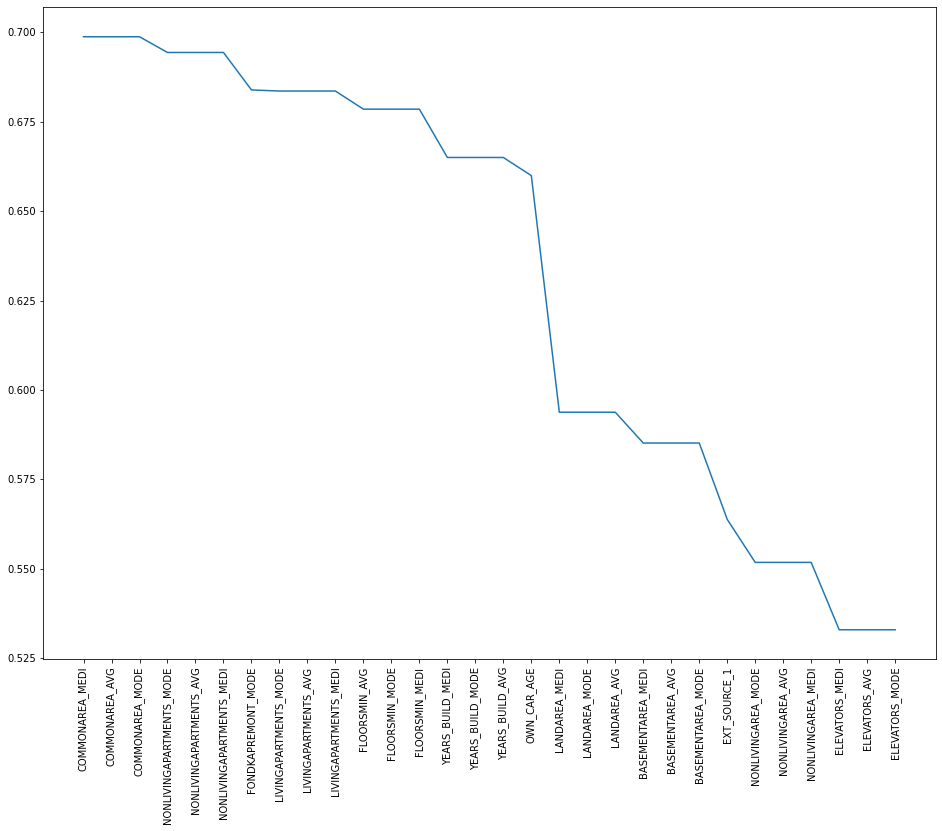

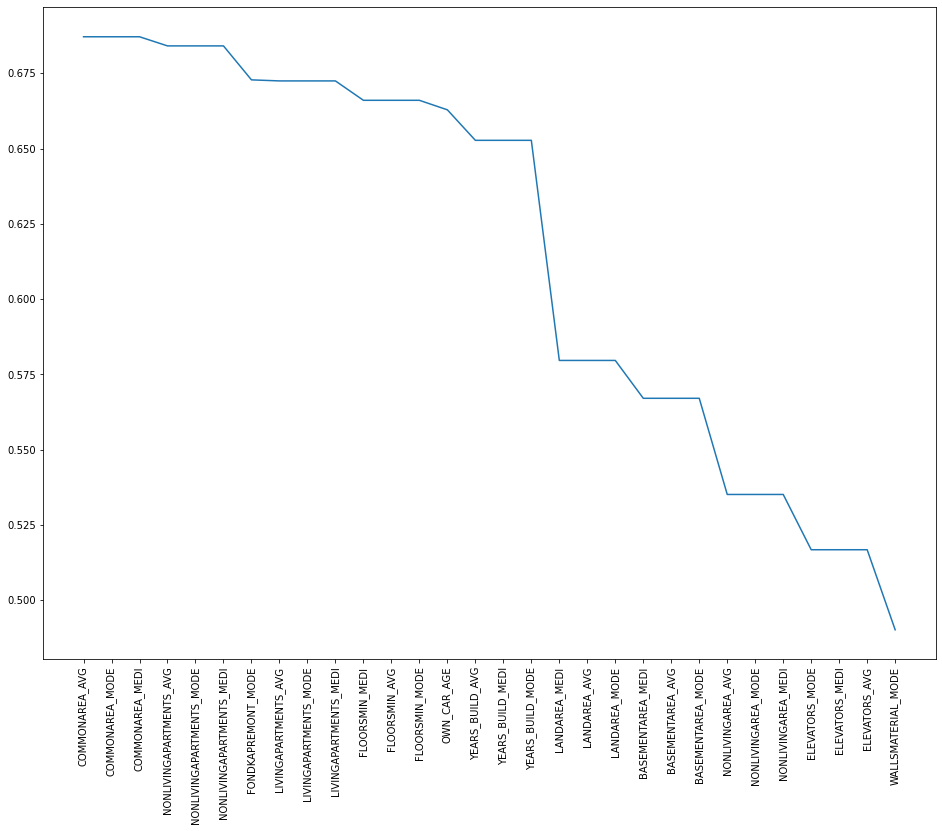

,WALLSMATERIAL_MODE,APARTMENTS_MODE,APARTMENTS_MEDI,APARTMENTS_AVG,HOUSETYPE_MODE,ENTRANCES_MODE,ENTRANCES_AVG,ENTRANCES_MEDI,LIVINGAREA_MEDI,LIVINGAREA_MODE,...,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR,EXT_SOURCE_1
0,"Stone, brick",0.0672,0.0666,0.0660,block of flats,0.1379,0.1379,0.1379,0.0514,0.0526,...,-5170.0,-2329,-19241,0.018850,House / apartment,Married,Higher education,Working,100001,0.752614
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-9118.0,-4469,-18064,0.035792,House / apartment,Married,Secondary / secondary special,Working,100005,0.564990
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-2175.0,-4458,-20038,0.019101,House / apartment,Married,Higher education,Working,100013,NaN
3,Panel,0.3109,0.3081,0.3052,block of flats,0.2759,0.2759,0.2759,0.3739,0.3827,...,-2000.0,-1866,-13976,0.026392,House / apartment,Married,Secondary / secondary special,Working,100028,0.525734
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-4000.0,-2191,-13040,0.010032,House / apartment,Married,Secondary / secondary special,Working,100038,0.202145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-9094.0,-5169,-19970,0.002042,House / apartment,Widow,Secondary / secondary special,Working,456221,NaN
48740,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-3015.0,-1149,-11186,0.035792,House / apartment,Married,Secondary / secondary special,Commercial associate,456222,NaN
48741,"Stone, brick",0.1134,0.1124,0.1113,block of flats,0.1379,0.1379,0.1379,0.1408,0.1441,...,-2681.0,-3037,-15922,0.026392,House / apartment,Married,Secondary / secondary special,Commercial associate,456223,0.733503
48742,Panel,0.1660,0.1645,0.1629,block of flats,0.0690,0.0690,0.0690,0.1591,0.1204,...,-1461.0,-2731,-13968,0.018850,House / apartment,Married,Higher education,Commercial associate,456224,0.373090


In [118]:
train_data_removing_missing=missing_values(data)
train_data_removing_missing
test_data_removing_missing=missing_values(data_test)
test_data_removing_missing

In [119]:
##Shape of test and train datasets after applying the above function

In [120]:
print(test_data_removing_missing.shape)
print(train_data_removing_missing.shape)

(48744, 92)
(307511, 82)


In [121]:
## A function for creating a distribution for all the continuous numeric variables
## We can see the graphs to see whether the variables and normally distributed and
## if there are any outliers in the variables

In [122]:
def continuous_variable_distributions(xdata,plot_type):
    
    for cols in xdata:
        
        if plot_type=='displot':
            sns.displot(data=xdata,x=cols,bins=25)
            plt.xticks(rotation=45)

In [123]:
## We can see that some variables are not normally distributed and 
## particularly in the days employed variable we can see aan outlier
## value with a considerable frequency. We shall investigate later

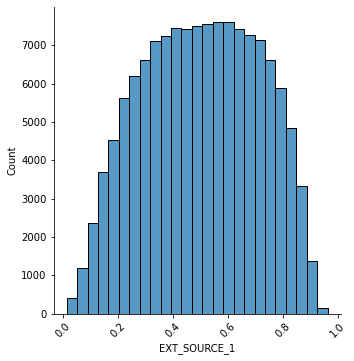

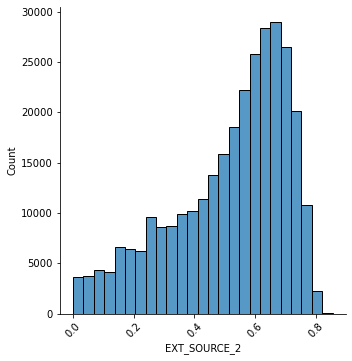

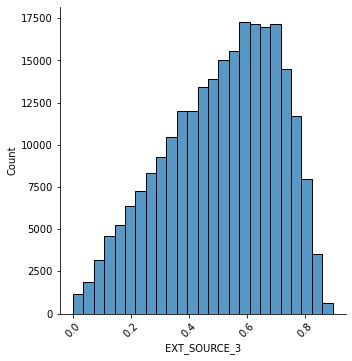

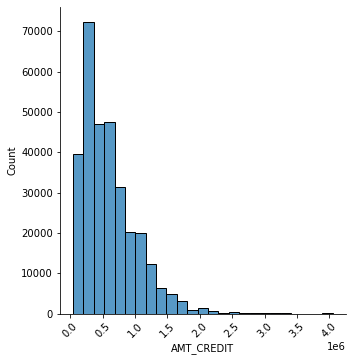

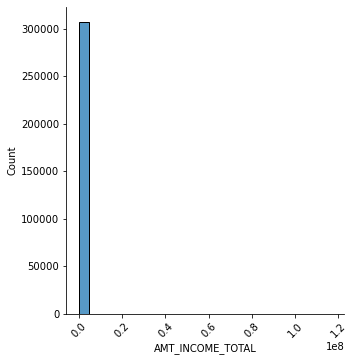

...

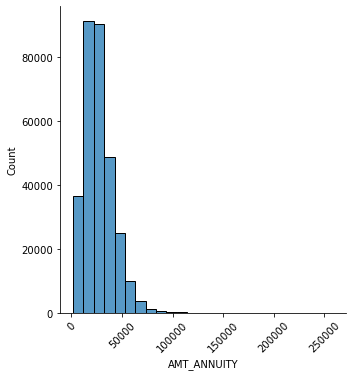

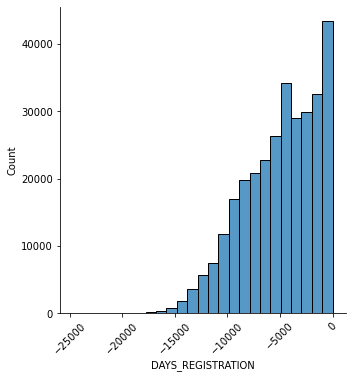

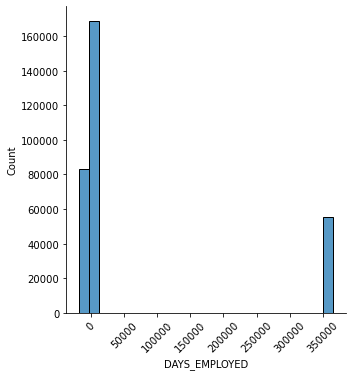

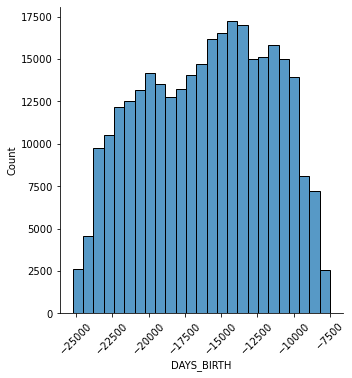

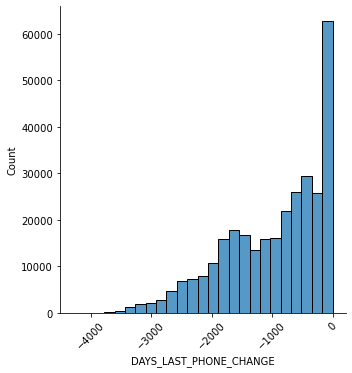

In [124]:
continuous_variable_distributions(train_data_removing_missing[cols],'displot')

In [ ]:
## The pandas profile report gives a detailed analysis
## of the variables denoting the missing values in each variable,
## the correlation and interaction between different variables
## along with a univariate plot of the variables
## We can see significant number of missing values in variables
## like EXT_SOURCE_1,EXT_SOURCE_2. We will treat them.

In [8]:
train_data_numerical.profile_report()

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
## This plot using missingno module shows the relationship
## between the missing values of different variables. As we can
## see the white lines represent missing values and they are largely 
## present in ext_source_1 and ext_source3. This plot can help us 
## to see if the missing values in ext_source_1 and ext_source3 are 
## correlated. We have to see whether missing values are random or 
## their appearance can be explained or can not be explained.

<AxesSubplot:>

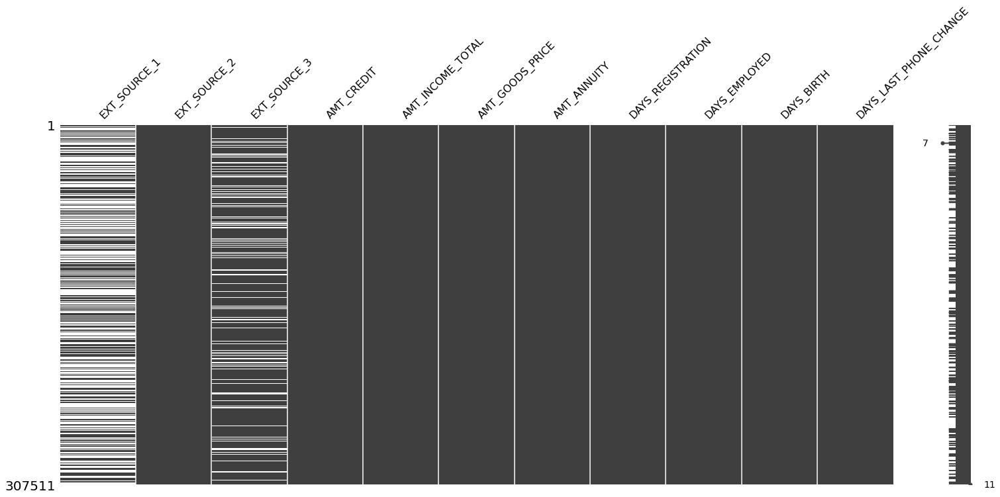

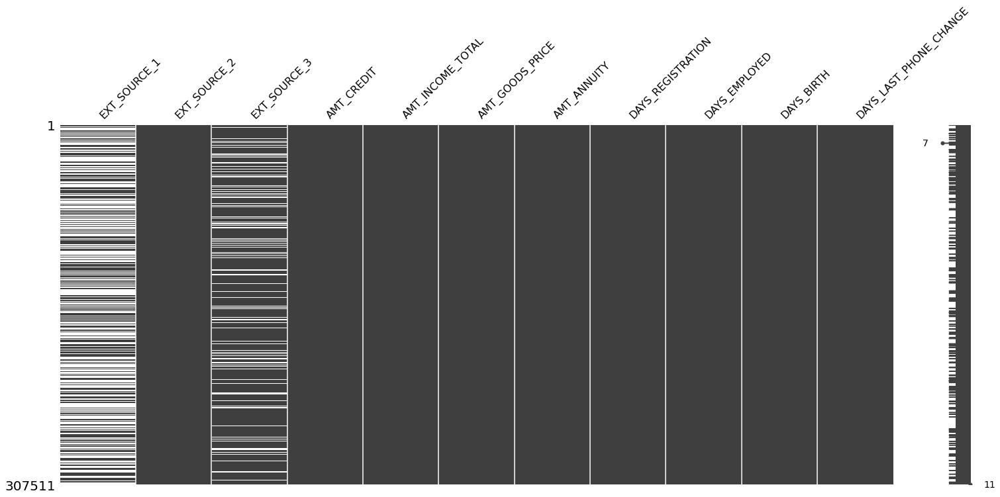

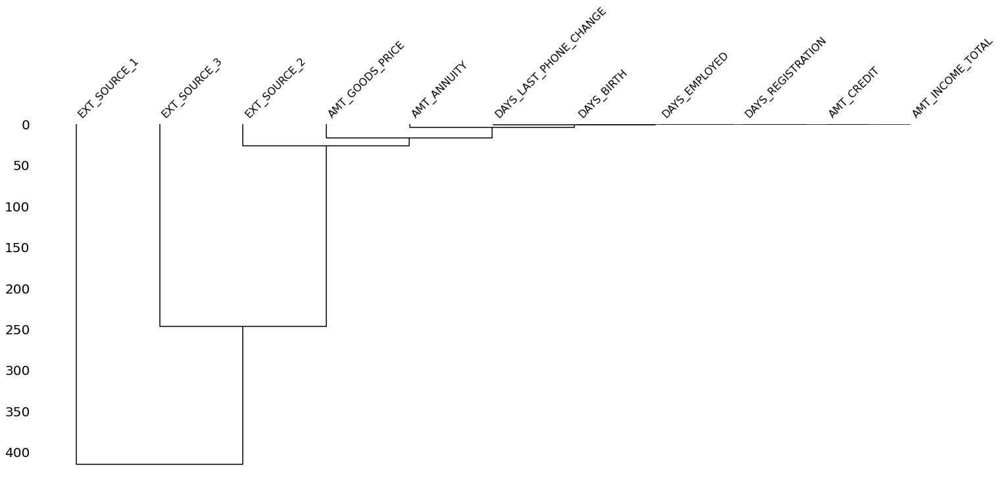

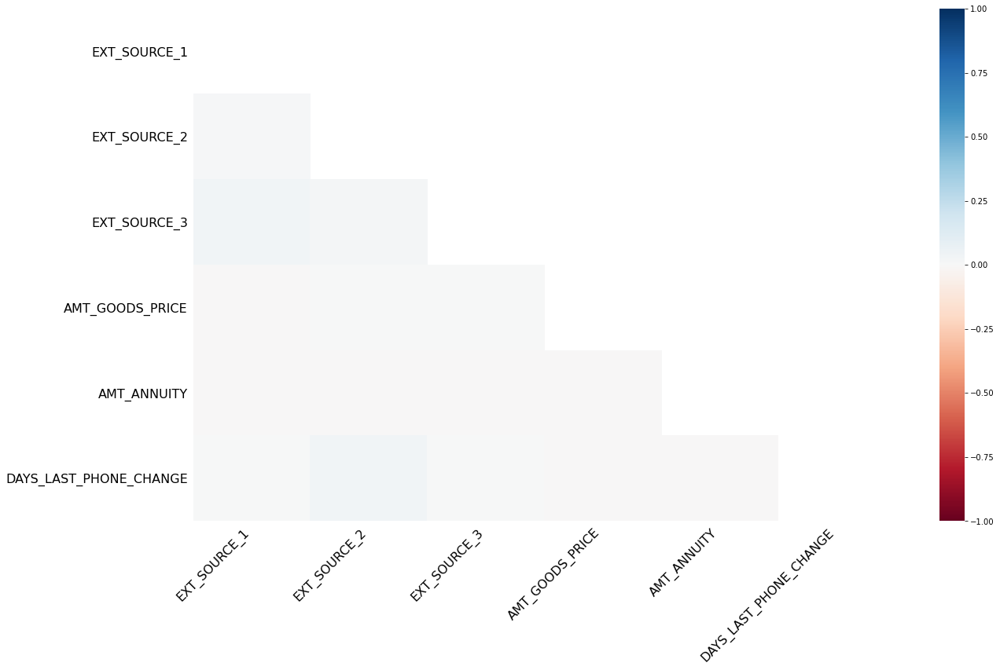

In [25]:
mngo.matrix(train_data_numerical)
sorted1=train_data_numerical.sort_values(by='EXT_SOURCE_1')
mngo.matrix(train_data_numerical)
mngo.dendrogram(train_data_numerical)
mngo.heatmap(train_data_numerical)

In [108]:
##Creating two flag variables to see which rows 
## are missing in ext_source_1 and ext_source_3.
## As we impute the missing values and these variables
## have significant proportion of missing values we 
## might to save this information as a flag column and 
## see if it can be an important feature later.
    

In [125]:
train_data_removing_missing['missing_ext_source_1'] = train_data_removing_missing['EXT_SOURCE_1'].apply(lambda x: 0 if pd.isnull(x)==True else 1)
train_data_removing_missing['missing_ext_source_3'] = train_data_removing_missing['EXT_SOURCE_3'].apply(lambda x: 0 if pd.isnull(x)==True else 1)
test_data_removing_missing['missing_ext_source_1'] = test_data_removing_missing['EXT_SOURCE_1'].apply(lambda x: 0 if pd.isnull(x)==True else 1)
test_data_removing_missing['missing_ext_source_3'] = test_data_removing_missing['EXT_SOURCE_3'].apply(lambda x: 0 if pd.isnull(x)==True else 1)

In [126]:
## Imputing all the missing values in continuous variables
## in both training and test dataset with median of the columns 
## in the training dataset so that there is no data leakage.
## Median is robust to outliers

In [127]:
cols=['EXT_SOURCE_1','EXT_SOURCE_3','AMT_CREDIT','AMT_INCOME_TOTAL','AMT_GOODS_PRICE','AMT_ANNUITY', 'DAYS_REGISTRATION','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_LAST_PHONE_CHANGE']

imp=SimpleImputer(missing_values=np.nan,strategy='median')
a=train_data_removing_missing[cols]
b=test_data_removing_missing[cols]
imp.fit(a)
data=pd.DataFrame(imp.transform(a))
data.rename(columns=dict(zip(data.columns,cols)),inplace=True)
x=train_data_removing_missing.drop(cols,axis=1)
train_data_removing_missing=pd.concat([data,x],axis=1)
data2=pd.DataFrame(imp.transform(b))
data2.rename(columns=dict(zip(data2.columns,cols)),inplace=True)
y=test_data_removing_missing.drop(cols,axis=1)
test_data_removing_missing=pd.concat([data2,y],axis=1)
print(test_data_removing_missing.shape)
print(train_data_removing_missing.shape)

(48744, 94)
(307511, 84)


In [128]:
## Checking whether the continuous variables have missing 
## values now after doing missing value imputation

In [129]:
print((train_data_removing_missing[cols]).isna().sum())
print((test_data_removing_missing[cols]).isna().sum())

EXT_SOURCE_1              0
EXT_SOURCE_3              0
AMT_CREDIT                0
AMT_INCOME_TOTAL          0
AMT_GOODS_PRICE           0
AMT_ANNUITY               0
DAYS_REGISTRATION         0
DAYS_BIRTH                0
DAYS_EMPLOYED             0
DAYS_LAST_PHONE_CHANGE    0
dtype: int64
EXT_SOURCE_1              0
EXT_SOURCE_3              0
AMT_CREDIT                0
AMT_INCOME_TOTAL          0
AMT_GOODS_PRICE           0
AMT_ANNUITY               0
DAYS_REGISTRATION         0
DAYS_BIRTH                0
DAYS_EMPLOYED             0
DAYS_LAST_PHONE_CHANGE    0
dtype: int64


In [130]:
## Now creating a function to detect the proportion of outliers
## in the continuous variables. Using two criteria to find the proportion
## First criteria:- twenty fifth percentile -1.5*IQR,seventy fifth percentile +1.5*IQR
## Second Criteria:-twenty fifth percentile -3*IQR,seventy fifth percentile +3*IQR
## Outliers according to first criteria we call light outliers and outliers according
## to second criteria we call heavy outliers

In [131]:
def outlier_detection(cols):
    
    dict_extreme={}
    dict_light={}
    
    for col in cols:
        q1=train_data_removing_missing[col].quantile(0.25)
        q3=train_data_removing_missing[col].quantile(0.75)
        left_boundary_extreme=q1-3*(q3-q1)
        right_boundary_extreme=q3+3*(q3-q1)
        left_boundary_light=q1-1.5*(q3-q1)
        right_boundary_light=q3+1.5*(q3-q1)
        outlier_list_extreme=[]
        outlier_list_light=[]
        for index,x in enumerate(train_data_removing_missing[col]):
            if (x<left_boundary_extreme) or (x>right_boundary_extreme):
                outlier_list_extreme.append(index)
            if (x<left_boundary_light) or(x>right_boundary_light):
                outlier_list_light.append(index)
        dict_extreme[col]=len(outlier_list_extreme)/len(train_data_removing_missing)
        dict_light[col]=len(outlier_list_light)/len(train_data_removing_missing)
    return dict_extreme,dict_light
        

In [132]:
## Converting all the continuous day variables into years.
## We convert days into positive and divide by 365 to get years

In [133]:
train_data_removing_missing['YEARS_EMPLOYED']=-1*(train_data_removing_missing['DAYS_EMPLOYED'])/365
train_data_removing_missing['YEARS_REGISTRATION']=-1*(train_data_removing_missing['DAYS_REGISTRATION'])/365
train_data_removing_missing['YEARS_BIRTH']=-1*(train_data_removing_missing['DAYS_BIRTH'])/365
train_data_removing_missing['YEARS_LAST_PHONE_CHANGE']=-1*(train_data_removing_missing['DAYS_LAST_PHONE_CHANGE'])/365
test_data_removing_missing['YEARS_EMPLOYED']=-1*(test_data_removing_missing['DAYS_EMPLOYED'])/365
test_data_removing_missing['YEARS_REGISTRATION']=-1*(test_data_removing_missing['DAYS_REGISTRATION'])/365
test_data_removing_missing['YEARS_BIRTH']=-1*(test_data_removing_missing['DAYS_BIRTH'])/365
test_data_removing_missing['YEARS_LAST_PHONE_CHANGE']=-1*(test_data_removing_missing['DAYS_LAST_PHONE_CHANGE'])/365

In [135]:
## Applying outlier detection columns on the continuos variables
## we see that days employed has significant proportion of outliers
## which we saw in the graph. ext_source_1 has high proportion but the 
## range is (0,1) so we can ignore this variable

In [134]:
cols=['EXT_SOURCE_1','EXT_SOURCE_2', 'EXT_SOURCE_3','AMT_CREDIT','AMT_INCOME_TOTAL','AMT_GOODS_PRICE','AMT_ANNUITY', 'DAYS_REGISTRATION','DAYS_EMPLOYED','DAYS_BIRTH','DAYS_LAST_PHONE_CHANGE']

outlier_detection(cols)

({'EXT_SOURCE_1': 0.43618277069763356,
  'EXT_SOURCE_2': 0.0,
  'EXT_SOURCE_3': 0.0,
  'AMT_CREDIT': 0.001443850789077464,
  'AMT_INCOME_TOTAL': 0.009801275401530352,
  'AMT_GOODS_PRICE': 0.0035445886488613414,
  'AMT_ANNUITY': 0.0033299621802146914,
  'DAYS_REGISTRATION': 3.2519161916159095e-06,
  'DAYS_EMPLOYED': 0.193892251008907,
  'DAYS_BIRTH': 0.0,
  'DAYS_LAST_PHONE_CHANGE': 0.0},
 {'EXT_SOURCE_1': 0.43618277069763356,
  'EXT_SOURCE_2': 0.0,
  'EXT_SOURCE_3': 0.01402551453443942,
  'AMT_CREDIT': 0.0213390740493836,
  'AMT_INCOME_TOTAL': 0.045640643749329295,
  'AMT_GOODS_PRICE': 0.04789422167011912,
  'AMT_ANNUITY': 0.024402379101885786,
  'DAYS_REGISTRATION': 0.0021430127702748844,
  'DAYS_EMPLOYED': 0.23484363160992616,
  'DAYS_BIRTH': 0.0,
  'DAYS_LAST_PHONE_CHANGE': 0.0014145835433529207})

In [ ]:
## Plot to show proportion of heavy and light outliers

{'EXT_SOURCE_1': 0.43618277069763356, 'EXT_SOURCE_2': 0.0, 'EXT_SOURCE_3': 0.0, 'AMT_CREDIT': 0.001443850789077464, 'AMT_INCOME_TOTAL': 0.009801275401530352, 'AMT_GOODS_PRICE': 0.0035445886488613414, 'AMT_ANNUITY': 0.0033299621802146914, 'DAYS_REGISTRATION': 3.2519161916159095e-06, 'DAYS_EMPLOYED': 0.18007160719453938, 'DAYS_BIRTH': 0.0, 'DAYS_LAST_PHONE_CHANGE': 0.0}
{'EXT_SOURCE_1': 0.43618277069763356, 'EXT_SOURCE_2': 0.0, 'EXT_SOURCE_3': 0.01402551453443942, 'AMT_CREDIT': 0.0213390740493836, 'AMT_INCOME_TOTAL': 0.045640643749329295, 'AMT_GOODS_PRICE': 0.04789422167011912, 'AMT_ANNUITY': 0.024402379101885786, 'DAYS_REGISTRATION': 0.0021430127702748844, 'DAYS_EMPLOYED': 0.18326824081089782, 'DAYS_BIRTH': 0.0, 'DAYS_LAST_PHONE_CHANGE': 0.0014145835433529207}


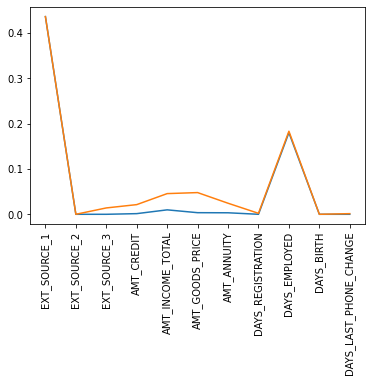

In [79]:
cols=['EXT_SOURCE_1','EXT_SOURCE_2', 'EXT_SOURCE_3','AMT_CREDIT','AMT_INCOME_TOTAL','AMT_GOODS_PRICE','AMT_ANNUITY', 'DAYS_REGISTRATION','DAYS_EMPLOYED','DAYS_BIRTH','DAYS_LAST_PHONE_CHANGE']

dict_extreme,dict_light=outlier_detection(cols)
print(dict_extreme)
print(dict_light)
plt.plot(dict_extreme.keys(),dict_extreme.values())
plt.xticks(rotation=90)
plt.plot(dict_light.keys(),dict_light.values())
plt.xticks(rotation=90)
plt.show()

In [ ]:
## Creating a dataframe to see the range of values
## from 90 to 99.9 percentile for all continuous variables
## This can be used in outlier imputation

In [136]:
def quantile_length(data,cols):
    quantile_list={}
    
    outlier_list=[]
    for col in cols:
        for quantile in [0.90,0.925,0.95,0.975,0.99,0.999]:
        
            outlier_list.append(data[col].quantile(quantile))
        outlier_list.append(data[col].max())
        outlier_list.append(data[col].min())
        outlier_list.append(data[col].mean())
        quantile_list[col]=outlier_list
        outlier_list=[]
            
    return quantile_list   

In [137]:
cols=['EXT_SOURCE_1','EXT_SOURCE_2', 'EXT_SOURCE_3','AMT_CREDIT','AMT_INCOME_TOTAL','AMT_GOODS_PRICE','AMT_ANNUITY', 'DAYS_REGISTRATION','DAYS_EMPLOYED','DAYS_BIRTH','DAYS_LAST_PHONE_CHANGE']
quantile_list=quantile_length(train_data_removing_missing,cols)
quantile_list_dataframe=pd.DataFrame(quantile_list,index=['90 percentile','92.5 percentile','95 percentile','97.5 percentile','99 percentile','99.9 percentile','max','min','mean'])
print(quantile_list_dataframe)
#print(train_data_removing_missing[cols].describe())
#for key,values in quantile_list.items():
 #   print(key,values)

                 EXT_SOURCE_1  EXT_SOURCE_2  EXT_SOURCE_3    AMT_CREDIT  \
90 percentile        0.689567  7.220467e-01      0.735221  1.133748e+06   
92.5 percentile      0.730361  7.341207e-01      0.754406  1.260702e+06   
95 percentile        0.774250  7.477341e-01      0.777659  1.350000e+06   
97.5 percentile      0.824849  7.656546e-01      0.807274  1.574532e+06   
99 percentile        0.866107  7.827928e-01      0.832785  1.854000e+06   
99.9 percentile      0.915473  8.039031e-01      0.863363  2.517300e+06   
max                  0.962693  8.549997e-01      0.896010  4.050000e+06   
min                  0.014568  8.173617e-08      0.000527  4.500000e+04   
mean                 0.504311  5.143927e-01      0.515695  5.990260e+05   

                 AMT_INCOME_TOTAL  AMT_GOODS_PRICE    AMT_ANNUITY  \
90 percentile        2.700000e+05     1.093500e+06   45954.000000   
92.5 percentile      2.925000e+05     1.125000e+06   48955.500000   
95 percentile        3.375000e+05     1.30

In [ ]:
## Creating an outlier variable for years employed
## we will impute the outliers in the variable with its mean
## so we create a flag to see which rows are outliers so maybe
## this feature can be useful in modelling

In [15]:
train_data_removing_missing['years_employed_outlier']=train_data_removing_missing['YEARS_EMPLOYED'].apply(lambda x:1 if x>=1000.66 else 0)
train_data_removing_missing                                                                                         

,EXT_SOURCE_1,EXT_SOURCE_3,AMT_CREDIT,AMT_INCOME_TOTAL,AMT_GOODS_PRICE,AMT_ANNUITY,DAYS_REGISTRATION,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_LAST_PHONE_CHANGE,...,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR,missing_ext_source_1,missing_ext_source_3,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_BIRTH,YEARS_LAST_PHONE_CHANGE,years_employed_outlier
0,0.083037,0.139376,406597.5,202500.0,351000.0,24700.5,-3648.0,-9461.0,-637.0,-1134.0,...,Secondary / secondary special,Working,100002,1,1,1.745205,9.994521,25.920548,3.106849,0
1,0.311267,0.535276,1293502.5,270000.0,1129500.0,35698.5,-1186.0,-16765.0,-1188.0,-828.0,...,Higher education,State servant,100003,1,0,3.254795,3.249315,45.931507,2.268493,0
2,0.505998,0.729567,135000.0,67500.0,135000.0,6750.0,-4260.0,-19046.0,-225.0,-815.0,...,Secondary / secondary special,Working,100004,0,1,0.616438,11.671233,52.180822,2.232877,0
3,0.505998,0.535276,312682.5,135000.0,297000.0,29686.5,-9833.0,-19005.0,-3039.0,-617.0,...,Secondary / secondary special,Working,100006,0,0,8.326027,26.939726,52.068493,1.690411,0
4,0.505998,0.535276,513000.0,121500.0,513000.0,21865.5,-4311.0,-19932.0,-3038.0,-1106.0,...,Secondary / secondary special,Working,100007,0,0,8.323288,11.810959,54.608219,3.030137,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0.145570,0.535276,254700.0,157500.0,225000.0,27558.0,-8456.0,-9327.0,-236.0,-273.0,...,Secondary / secondary special,Working,456251,1,0,0.646575,23.167123,25.553425,0.747945,0
307507,0.505998,0.535276,269550.0,72000.0,225000.0,12001.5,-4388.0,-20775.0,365243.0,0.0,...,Secondary / secondary special,Pensioner,456252,0,0,-1000.665753,12.021918,56.917808,-0.000000,0
307508,0.744026,0.218859,677664.0,153000.0,585000.0,29979.0,-6737.0,-14966.0,-7921.0,-1909.0,...,Higher education,Working,456253,1,1,21.701370,18.457534,41.002740,5.230137,0
307509,0.505998,0.661024,370107.0,171000.0,319500.0,20205.0,-2562.0,-11961.0,-4786.0,-322.0,...,Secondary / secondary special,Commercial associate,456254,0,1,13.112329,7.019178,32.769863,0.882192,0


In [16]:
test_data_removing_missing['years_employed_outlier']=test_data_removing_missing['YEARS_EMPLOYED'].apply(lambda x:1 if x>=1000.66 else 0)
test_data_removing_missing                                                                                         

,EXT_SOURCE_1,EXT_SOURCE_3,AMT_CREDIT,AMT_INCOME_TOTAL,AMT_GOODS_PRICE,AMT_ANNUITY,DAYS_REGISTRATION,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_LAST_PHONE_CHANGE,...,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR,missing_ext_source_1,missing_ext_source_3,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_BIRTH,YEARS_LAST_PHONE_CHANGE,years_employed_outlier
0,0.752614,0.159520,568800.0,135000.0,450000.0,20560.5,-5170.0,-19241.0,-2329.0,-1740.0,...,Higher education,Working,100001,1,1,6.380822,14.164384,52.715068,4.767123,0
1,0.564990,0.432962,222768.0,99000.0,180000.0,17370.0,-9118.0,-18064.0,-4469.0,0.0,...,Secondary / secondary special,Working,100005,1,1,12.243836,24.980822,49.490411,-0.000000,0
2,0.505998,0.610991,663264.0,202500.0,630000.0,69777.0,-2175.0,-20038.0,-4458.0,-856.0,...,Higher education,Working,100013,0,1,12.213699,5.958904,54.898630,2.345205,0
3,0.525734,0.612704,1575000.0,315000.0,1575000.0,49018.5,-2000.0,-13976.0,-1866.0,-1805.0,...,Secondary / secondary special,Working,100028,1,1,5.112329,5.479452,38.290411,4.945205,0
4,0.202145,0.535276,625500.0,180000.0,625500.0,32067.0,-4000.0,-13040.0,-2191.0,-821.0,...,Secondary / secondary special,Working,100038,1,0,6.002740,10.958904,35.726027,2.249315,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,0.505998,0.643026,412560.0,121500.0,270000.0,17473.5,-9094.0,-19970.0,-5169.0,-684.0,...,Secondary / secondary special,Working,456221,0,1,14.161644,24.915068,54.712329,1.873973,0
48740,0.505998,0.535276,622413.0,157500.0,495000.0,31909.5,-3015.0,-11186.0,-1149.0,0.0,...,Secondary / secondary special,Commercial associate,456222,0,0,3.147945,8.260274,30.646575,-0.000000,0
48741,0.733503,0.283712,315000.0,202500.0,315000.0,33205.5,-2681.0,-15922.0,-3037.0,-838.0,...,Secondary / secondary special,Commercial associate,456223,1,1,8.320548,7.345205,43.621918,2.295890,0
48742,0.373090,0.595456,450000.0,225000.0,450000.0,25128.0,-1461.0,-13968.0,-2731.0,-2308.0,...,Higher education,Commercial associate,456224,1,1,7.482192,4.002740,38.268493,6.323288,0


In [ ]:
## We create an outlier replacement function.
## the values less than fifth percentile will
## be replaced by fifth percentile and values greater
## than ninety fifth percentile replaced by ninety fifth
## percentile. This range (0.05,0.95) is normally used

In [17]:
def outlier_replacement(cols):
    
    for col in cols:
        left_boundary=train_data_removing_missing[col].quantile(0.05)
        right_boundary=train_data_removing_missing[col].quantile(0.95)

        train_data_removing_missing[col]=np.where(train_data_removing_missing[col]<left_boundary,left_boundary,train_data_removing_missing[col])
        train_data_removing_missing[col]=np.where(train_data_removing_missing[col]>right_boundary,right_boundary,train_data_removing_missing[col])
        
        test_data_removing_missing[col]=np.where(test_data_removing_missing[col]<left_boundary,left_boundary,test_data_removing_missing[col])
        test_data_removing_missing[col]=np.where(test_data_removing_missing[col]>right_boundary,right_boundary,test_data_removing_missing[col])


    return(train_data_removing_missing,test_data_removing_missing) 

In [ ]:
## For days employed because the values are same
## starting from ninety fifth percentile and above so any value greater than ninety
## fifth percentile will be replaced by median.
## For years employed because the values are same
## starting from fifth percentile and below so any value greater less than
## fifth percentile will be replaced by median.

In [18]:
left_boundary=train_data_removing_missing['DAYS_EMPLOYED'].quantile(0.05)
right_boundary=train_data_removing_missing['DAYS_EMPLOYED'].quantile(0.95)
median=train_data_removing_missing['DAYS_EMPLOYED'].median()
left_boundary2=train_data_removing_missing['YEARS_EMPLOYED'].quantile(0.05)
right_boundary2=train_data_removing_missing['YEARS_EMPLOYED'].quantile(0.95)
median2=train_data_removing_missing['YEARS_EMPLOYED'].median()

train_data_removing_missing['DAYS_EMPLOYED']=np.where(train_data_removing_missing['DAYS_EMPLOYED']<=left_boundary,left_boundary,train_data_removing_missing['DAYS_EMPLOYED'])
train_data_removing_missing['DAYS_EMPLOYED']=np.where(train_data_removing_missing['DAYS_EMPLOYED']>=right_boundary,median,train_data_removing_missing['DAYS_EMPLOYED'])
train_data_removing_missing['DAYS_EMPLOYED'].describe()
test_data_removing_missing['DAYS_EMPLOYED']=np.where(test_data_removing_missing['DAYS_EMPLOYED']<=left_boundary,left_boundary,test_data_removing_missing['DAYS_EMPLOYED'])
test_data_removing_missing['DAYS_EMPLOYED']=np.where(test_data_removing_missing['DAYS_EMPLOYED']>=right_boundary,median,test_data_removing_missing['DAYS_EMPLOYED'])
test_data_removing_missing['DAYS_EMPLOYED'].describe()

train_data_removing_missing['YEARS_EMPLOYED']=np.where(train_data_removing_missing['YEARS_EMPLOYED']<=left_boundary2,median2,train_data_removing_missing['YEARS_EMPLOYED'])
train_data_removing_missing['YEARS_EMPLOYED']=np.where(train_data_removing_missing['YEARS_EMPLOYED']>=right_boundary2,right_boundary2,train_data_removing_missing['YEARS_EMPLOYED'])
train_data_removing_missing['YEARS_EMPLOYED'].describe()
test_data_removing_missing['YEARS_EMPLOYED']=np.where(test_data_removing_missing['YEARS_EMPLOYED']<=left_boundary2,median2,test_data_removing_missing['YEARS_EMPLOYED'])
test_data_removing_missing['YEARS_EMPLOYED']=np.where(test_data_removing_missing['YEARS_EMPLOYED']>=right_boundary2,right_boundary2,test_data_removing_missing['YEARS_EMPLOYED'])
test_data_removing_missing['YEARS_EMPLOYED'].describe()


count    48744.000000
mean         5.810019
std          4.777801
min          0.002740
25%          2.871233
50%          3.542466
75%          7.972603
max         18.472603
Name: YEARS_EMPLOYED, dtype: float64

In [ ]:
## Checking outlier proportion after applying the function
## and we see considerable drop in outliers in all continuous 
## variables

In [19]:
train_data_removing_missing,test_data_removing_missing=outlier_replacement(cols)
outlier_detection(cols)

({'EXT_SOURCE_1': 0.43618277069763356,
  'EXT_SOURCE_2': 0.0,
  'EXT_SOURCE_3': 0.0,
  'AMT_CREDIT': 0.0,
  'AMT_INCOME_TOTAL': 0.0,
  'AMT_GOODS_PRICE': 0.0,
  'AMT_ANNUITY': 0.0,
  'DAYS_REGISTRATION': 0.0,
  'DAYS_EMPLOYED': 0.0,
  'DAYS_BIRTH': 0.0,
  'DAYS_LAST_PHONE_CHANGE': 0.0},
 {'EXT_SOURCE_1': 0.43618277069763356,
  'EXT_SOURCE_2': 0.0,
  'EXT_SOURCE_3': 0.0,
  'AMT_CREDIT': 0.0,
  'AMT_INCOME_TOTAL': 0.0,
  'AMT_GOODS_PRICE': 0.0,
  'AMT_ANNUITY': 0.0,
  'DAYS_REGISTRATION': 0.0,
  'DAYS_EMPLOYED': 0.07527535600352507,
  'DAYS_BIRTH': 0.0,
  'DAYS_LAST_PHONE_CHANGE': 0.0})

In [ ]:
## Outlier detection in years column and we see reduction 
##in outliers in the years column

In [20]:
col_new=['YEARS_REGISTRATION','YEARS_EMPLOYED','YEARS_BIRTH','YEARS_LAST_PHONE_CHANGE']
train_data_removing_missing,test_data_removing_missing=outlier_replacement(col_new)
outlier_detection(col_new)

({'YEARS_REGISTRATION': 0.0,
  'YEARS_EMPLOYED': 0.0,
  'YEARS_BIRTH': 0.0,
  'YEARS_LAST_PHONE_CHANGE': 0.0},
 {'YEARS_REGISTRATION': 0.0,
  'YEARS_EMPLOYED': 0.07527535600352507,
  'YEARS_BIRTH': 0.0,
  'YEARS_LAST_PHONE_CHANGE': 0.0})

In [ ]:
## Now we see the distributions of the continuous variables
## after outlier repalcement and we see that some variables have improved
## to normal distribution. Some still have skewed distributions but in days
## employed and years employed the outliers and gone and the distribution
## is better now. We have also applied the min max scaler so as to bring
## all the variables on a consistent scale so that the model does not give 
## weights based on difference in scales

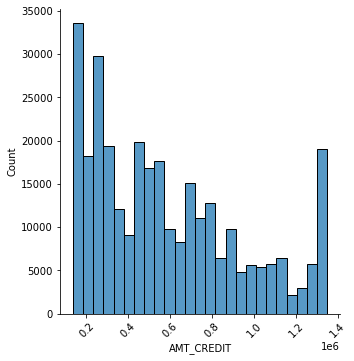

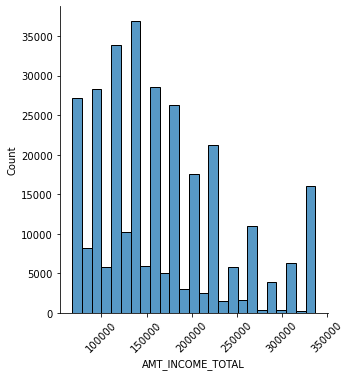

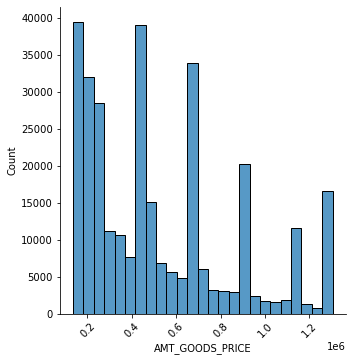

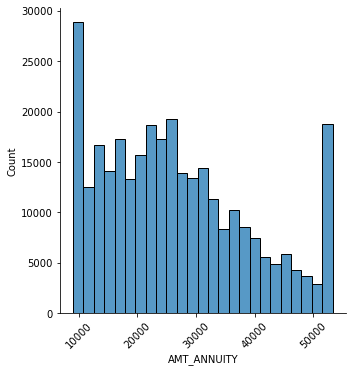

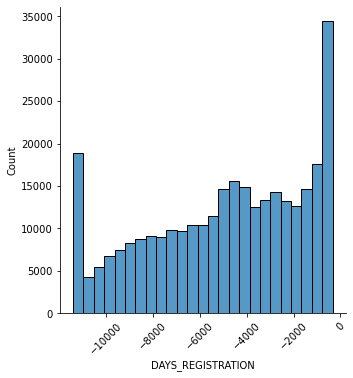

...

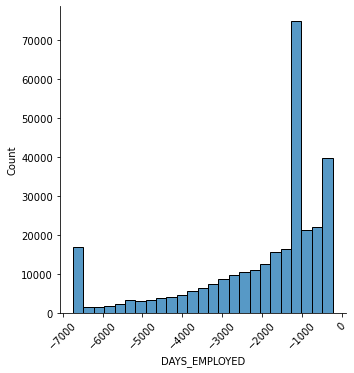

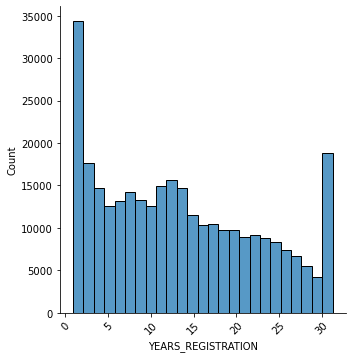

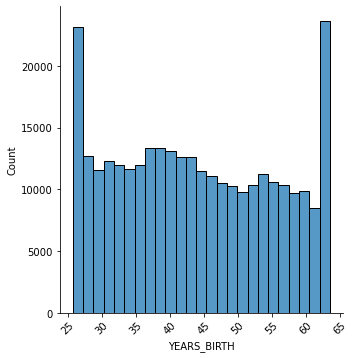

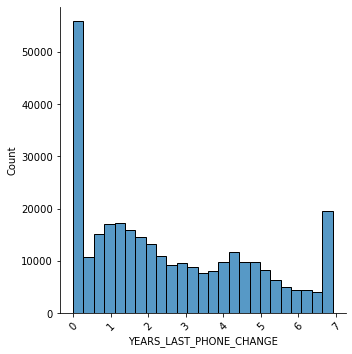

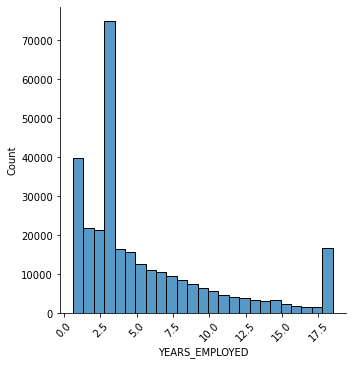

In [21]:
cols=['AMT_CREDIT','AMT_INCOME_TOTAL','AMT_GOODS_PRICE','AMT_ANNUITY', 'DAYS_REGISTRATION','DAYS_BIRTH','DAYS_LAST_PHONE_CHANGE'
     ,'DAYS_EMPLOYED','YEARS_REGISTRATION','YEARS_BIRTH','YEARS_LAST_PHONE_CHANGE','YEARS_EMPLOYED']

transformer=MinMaxScaler()
transformer.fit_transform(train_data_removing_missing[cols])
transformer.transform(test_data_removing_missing[cols])
continuous_variable_distributions(train_data_removing_missing[cols],'displot')
#train_data_removing_missing[cols]=train_data_removing_missing[cols].apply(lambda x: np.sqrt(x))
#continuous_variable_distributions(train_data_removing_missing[cols],'displot')


In [ ]:
## Creating the density plots for all the continous
## variables grouped by the target variable. We want
## to see if the distribution is different for both the
## target labels which can signify that this continuous variable
## may be significant in detecting the target variable

<AxesSubplot:xlabel='AMT_INCOME_TOTAL', ylabel='Density'>

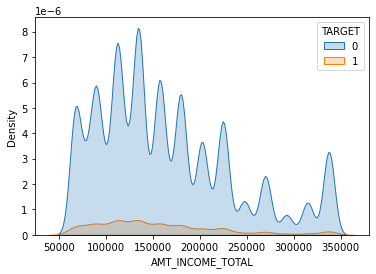

In [78]:
sns.kdeplot(data=a, x='AMT_INCOME_TOTAL',hue=target_y,fill=True)

<AxesSubplot:xlabel='AMT_GOODS_PRICE', ylabel='Density'>

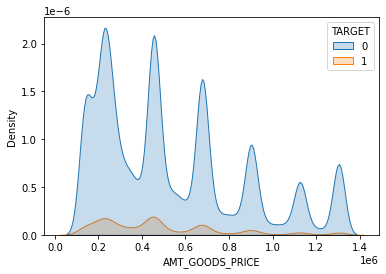

In [79]:
sns.kdeplot(data=a, x='AMT_GOODS_PRICE',hue=target_y,fill=True)

<AxesSubplot:xlabel='AMT_ANNUITY', ylabel='Density'>

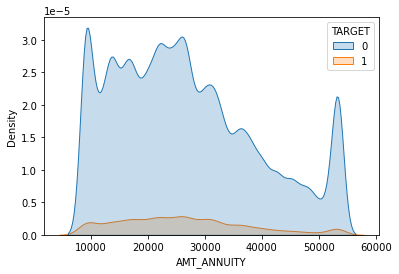

In [80]:
sns.kdeplot(data=a, x='AMT_ANNUITY',hue=target_y,fill=True)


<AxesSubplot:xlabel='DAYS_BIRTH', ylabel='Density'>

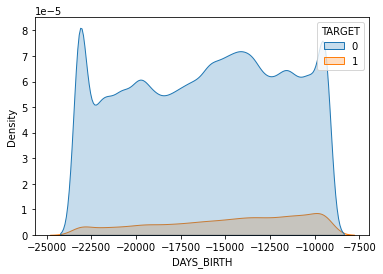

In [81]:
sns.kdeplot(data=a, x='DAYS_BIRTH',hue=target_y,fill=True)


<AxesSubplot:xlabel='DAYS_REGISTRATION', ylabel='Density'>

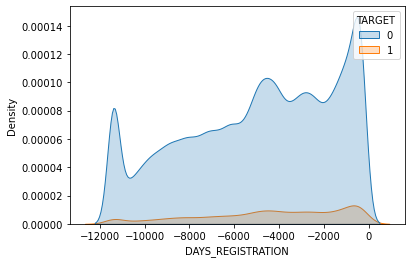

In [82]:
sns.kdeplot(data=a, x='DAYS_REGISTRATION',hue=target_y,fill=True)


<AxesSubplot:xlabel='DAYS_LAST_PHONE_CHANGE', ylabel='Density'>

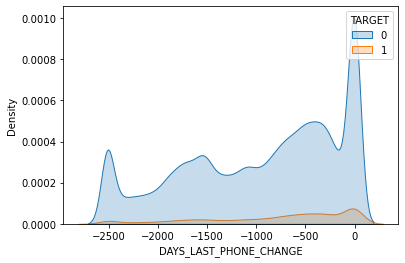

In [83]:
sns.kdeplot(data=a, x='DAYS_LAST_PHONE_CHANGE',hue=target_y,fill=True)


<AxesSubplot:xlabel='DAYS_EMPLOYED', ylabel='Density'>

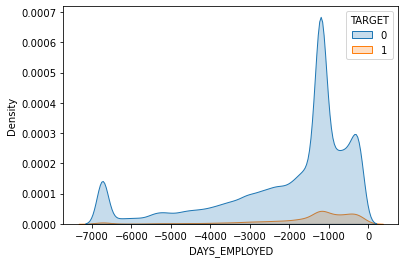

In [84]:
sns.kdeplot(data=a, x='DAYS_EMPLOYED',hue=target_y,fill=True)


<AxesSubplot:xlabel='YEARS_REGISTRATION', ylabel='Density'>

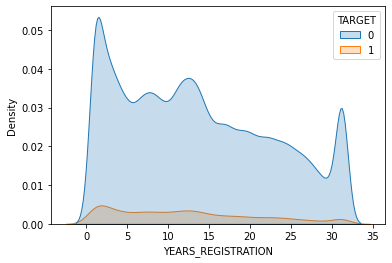

In [85]:
sns.kdeplot(data=a, x='YEARS_REGISTRATION',hue=target_y,fill=True)


<AxesSubplot:xlabel='YEARS_BIRTH', ylabel='Density'>

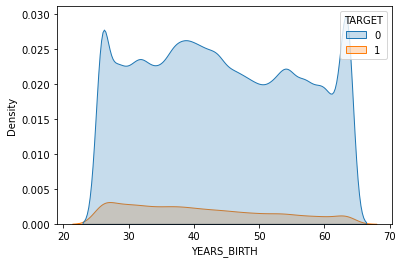

In [86]:
sns.kdeplot(data=a, x='YEARS_BIRTH',hue=target_y,fill=True)


<AxesSubplot:xlabel='YEARS_LAST_PHONE_CHANGE', ylabel='Density'>

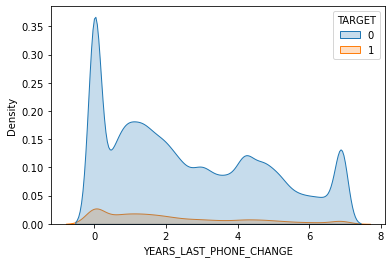

In [87]:
sns.kdeplot(data=a, x='YEARS_LAST_PHONE_CHANGE',hue=target_y,fill=True)


<AxesSubplot:xlabel='YEARS_EMPLOYED', ylabel='Density'>

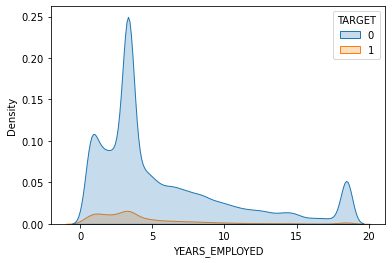

In [88]:
sns.kdeplot(data=a, x='YEARS_EMPLOYED',hue=target_y,fill=True)

In [23]:
##The density plots reveal not a lot so we will use 
## other methods to select the features

In [24]:
## Now for the remaining categorical variables we will 
## do target encoding. which means we replace all the 
##classes with their respective means. This converts this
##into a continuous variable which may be more helpful
##than a label or one hot encoding because this now contains
##significant information from the target labels

In [22]:
te=TargetEncoder()
train_data_removing_missing=te.fit_transform(train_data_removing_missing,target_y)
train_data_removing_missing.shape

C:\Users\venkatesh\Anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


(307511, 89)

In [25]:
## Now seeing the distribution of target encoded variables

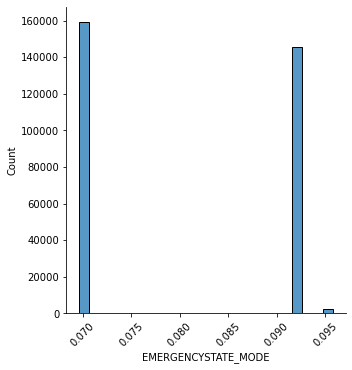

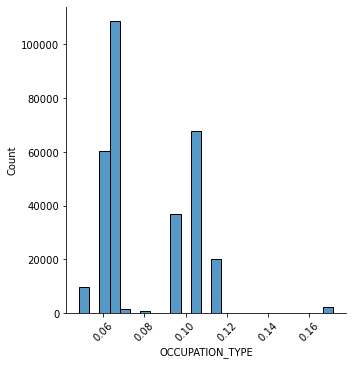

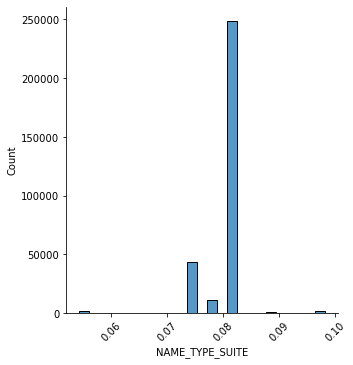

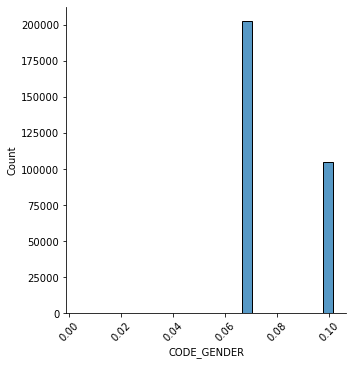

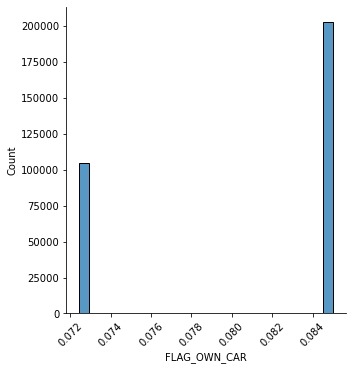

...

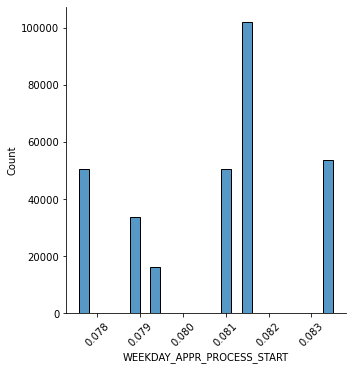

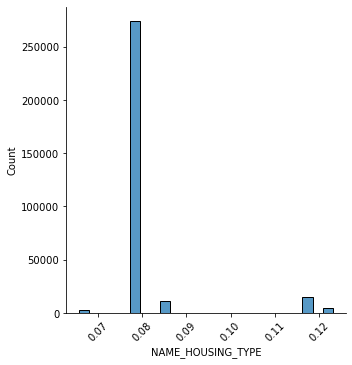

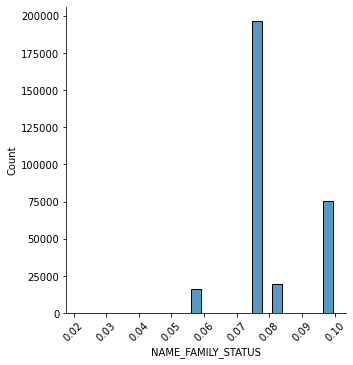

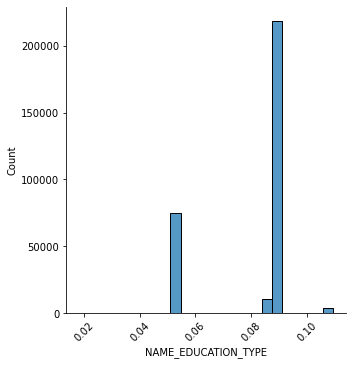

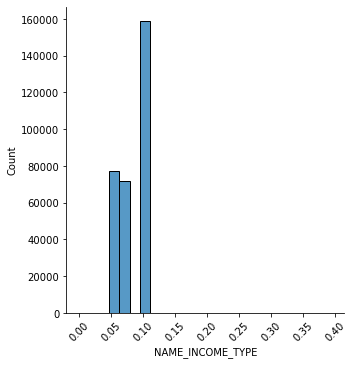

In [57]:
target_encoded_columns=[ 'EMERGENCYSTATE_MODE',
       'OCCUPATION_TYPE', 'NAME_TYPE_SUITE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'ORGANIZATION_TYPE', 'NAME_CONTRACT_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'NAME_HOUSING_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_EDUCATION_TYPE', 'NAME_INCOME_TYPE']
continuous_variable_distributions(train_data_removing_missing[target_encoded_columns],'displot')


In [ ]:
## Now seeing the density plots of the target encoded variables
##with the target variable so as to see which target encoded variable
## is important

<AxesSubplot:xlabel='NAME_TYPE_SUITE', ylabel='Density'>

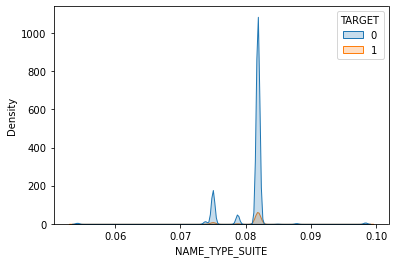

In [94]:
sns.kdeplot(data=train_data_removing_missing, x='NAME_TYPE_SUITE',hue=target_y,fill=True)

<AxesSubplot:xlabel='CODE_GENDER', ylabel='Density'>

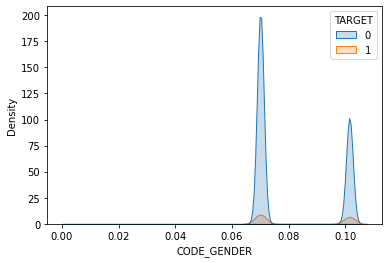

In [95]:
sns.kdeplot(data=train_data_removing_missing, x='CODE_GENDER',hue=target_y,fill=True)

<AxesSubplot:xlabel='FLAG_OWN_CAR', ylabel='Density'>

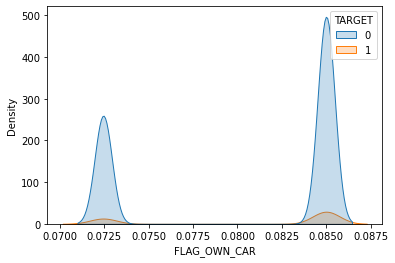

In [97]:
sns.kdeplot(data=train_data_removing_missing, x='FLAG_OWN_CAR',hue=target_y,fill=True)

<AxesSubplot:xlabel='FLAG_OWN_REALTY', ylabel='Density'>

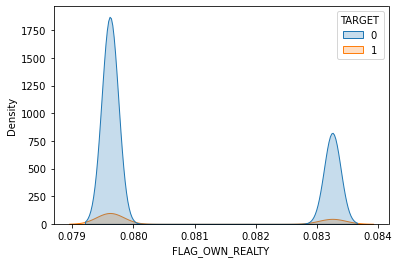

In [106]:
sns.kdeplot(data=train_data_removing_missing, x='FLAG_OWN_REALTY',hue=target_y,fill=True)

<AxesSubplot:xlabel='ORGANIZATION_TYPE', ylabel='Density'>

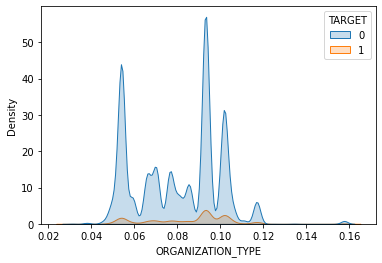

In [99]:
sns.kdeplot(data=train_data_removing_missing, x='ORGANIZATION_TYPE',hue=target_y,fill=True)

<AxesSubplot:xlabel='NAME_CONTRACT_TYPE', ylabel='Density'>

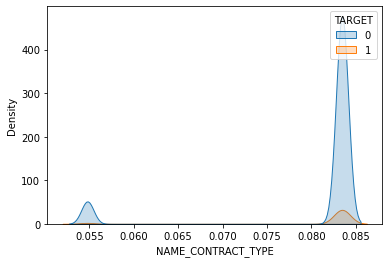

In [100]:
sns.kdeplot(data=train_data_removing_missing, x='NAME_CONTRACT_TYPE',hue=target_y,fill=True)

<AxesSubplot:xlabel='WEEKDAY_APPR_PROCESS_START', ylabel='Density'>

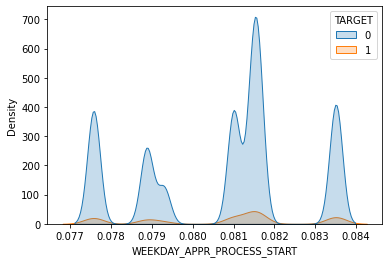

In [101]:
sns.kdeplot(data=train_data_removing_missing, x='WEEKDAY_APPR_PROCESS_START',hue=target_y,fill=True)

<AxesSubplot:xlabel='NAME_HOUSING_TYPE', ylabel='Density'>

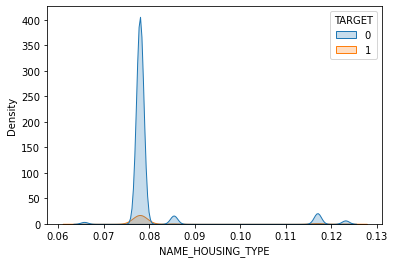

In [102]:
sns.kdeplot(data=train_data_removing_missing, x='NAME_HOUSING_TYPE',hue=target_y,fill=True)

<AxesSubplot:xlabel='NAME_FAMILY_STATUS', ylabel='Density'>

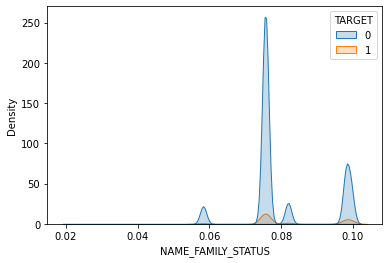

In [103]:
sns.kdeplot(data=train_data_removing_missing, x='NAME_FAMILY_STATUS',hue=target_y,fill=True)

<AxesSubplot:xlabel='NAME_EDUCATION_TYPE', ylabel='Density'>

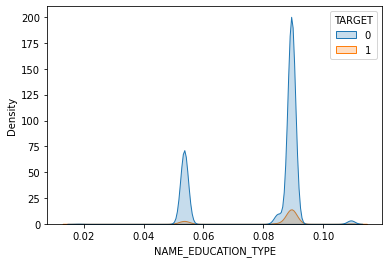

In [104]:
sns.kdeplot(data=train_data_removing_missing, x='NAME_EDUCATION_TYPE',hue=target_y,fill=True)

<AxesSubplot:xlabel='NAME_INCOME_TYPE', ylabel='Density'>

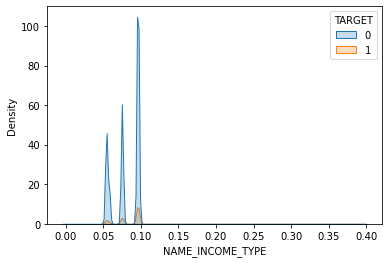

In [105]:
sns.kdeplot(data=train_data_removing_missing, x='NAME_INCOME_TYPE',hue=target_y,fill=True)

In [25]:
##The density plots reveal not a lot so we will use 
## other methods to select the features     
        

In [ ]:
## We now take all the continuous variables
##along with the newly target encoded variables and 
##pass it through an f_classif function which a sort of an anova
## test to see which continuous variable is important for target
##variable prediction

In [24]:
['EXT_SOURCE_1',
 'EXT_SOURCE_3',
 'AMT_CREDIT',
 'AMT_INCOME_TOTAL',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'DAYS_REGISTRATION',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_LAST_PHONE_CHANGE',
 'FLOORSMAX_MODE',
 'FLOORSMAX_MEDI',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BEGINEXPLUATATION_AVG',
 'TOTALAREA_MODE',
 'EMERGENCYSTATE_MODE',
 'OCCUPATION_TYPE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_TYPE_SUITE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'EXT_SOURCE_2',
 'CNT_FAM_MEMBERS',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'REGION_POPULATION_RELATIVE',
 'NAME_HOUSING_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_EDUCATION_TYPE',
 'NAME_INCOME_TYPE',
 'YEARS_EMPLOYED',
 'YEARS_REGISTRATION',
 'YEARS_BIRTH',
 'YEARS_LAST_PHONE_CHANGE']

#training_anova=pd.concat([train_data_removing_missing.loc[:,cols],target_y],axis=1)
#xtrain=x_training.select_dtypes(exclude='uint8')
fs_cat_an = SelectKBest(score_func=f_classif, k=5)
m=train_data_removing_missing[cols]
fs_cat_an.fit(m, target_y)
X_train_fs_cat = fs_cat_an.transform(m)
cols=fs_cat_an.get_support()
selected_feature_anova= []
for bool,feature in zip(cols,m.columns.to_list()):
    if bool:
        selected_feature_anova.append(feature)
    
selected_feature_anova


['DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'YEARS_BIRTH',
 'YEARS_LAST_PHONE_CHANGE',
 'YEARS_EMPLOYED']

In [ ]:
##From the anova test our important variables are:-['DAYS_BIRTH','DAYS_EMPLOYED','YEARS_BIRTH','YEARS_LAST_PHONE_CHANGE','YEARS_EMPLOYED']
## We take years employed and drop days_employed because days employed is used in creating the years employed variable and similarly
## we do it for yera birth


In [ ]:
## We take the features selected from anova as well as ext_source_1 and ext_source_3 because these two are 
##important variables. We selected some domain based features like amt_annuity, amt_credit, amt_income_total

In [26]:

fitted_data1=train_data_removing_missing[['EXT_SOURCE_1','EXT_SOURCE_3','YEARS_BIRTH','AMT_ANNUITY','AMT_CREDIT','AMT_INCOME_TOTAL','YEARS_EMPLOYED','YEARS_LAST_PHONE_CHANGE']] 


In [138]:
##Now trying different models starting with gradient boost 
##First we use grid search cross validation to find optimal number of 
##estimators. Our performance metric or scoring metric is roc_auc
## Let us tune some models and find the optimal hyperparameters

In [49]:
param_test1={'n_estimators': range(20,100,10)}
gsearch1 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1, min_samples_split=500,min_samples_leaf=50,max_depth=8,max_features='sqrt',subsample=0.8,random_state=10), 
param_grid = param_test1, scoring='roc_auc',n_jobs=4,iid=False, cv=5)
gsearch1.fit(fitted_data1,target_y)

C:\Users\venkatesh\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:849: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_depth=8,
                                                  max_features='sqrt',
                                                  min_samples_leaf=50,
                                                  min_samples_split=500,
                                                  random_state=10,
                                                  subsample=0.8),
             iid=False, n_jobs=4,
             param_grid={'n_estimators': range(20, 100, 10)},
             scoring='roc_auc')

In [ ]:
## Optimal number of estimators hyperparameter is 90

In [51]:
gsearch1.best_estimator_,gsearch1.best_score_,gsearch1.best_params_

(GradientBoostingClassifier(max_depth=8, max_features='sqrt',
                            min_samples_leaf=50, min_samples_split=500,
                            n_estimators=90, random_state=10, subsample=0.8),
 0.7125722918758439,
 {'n_estimators': 90})

In [ ]:
## Now we use grid search to find optimal min_samples_split hyperparameter

In [54]:
param_test2={'min_samples_split':range(1000,2100,200)}
gsearch2 = GridSearchCV(estimator = GradientBoostingClassifier(n_estimators=90,learning_rate=0.1,min_samples_leaf=50,max_features='sqrt',subsample=0.8,random_state=10), 
param_grid = param_test2, scoring='roc_auc',n_jobs=4,iid=False, cv=5)


C:\Users\venkatesh\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:849: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_depth=8,
                                                  max_features='sqrt',
                                                  min_samples_leaf=50,
                                                  min_samples_split=500,
                                                  random_state=10,
                                                  subsample=0.8),
             iid=False, n_jobs=4,
             param_grid={'n_estimators': range(20, 100, 10)},
             scoring='roc_auc')

In [ ]:
## we get min_samples_split as 1000

In [59]:
gsearch2.fit(fitted_data1,target_y)
gsearch2.best_estimator_,gsearch2.best_score_,gsearch2.best_params_

C:\Users\venkatesh\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:849: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


(GradientBoostingClassifier(max_depth=8, max_features='sqrt',
                            min_samples_leaf=50, min_samples_split=1000,
                            random_state=10, subsample=0.8),
 0.7134446347441425,
 {'min_samples_split': 1000})

In [ ]:
## Now we use grid search cv to find optimal min_samples_leaf hyperparameter
## which comes out to be 80

In [242]:
param_test3={ 'min_samples_leaf':range(30,100,10)}
gsearch3 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1, max_depth=8,min_samples_split=1000,max_features='sqrt',subsample=0.8,random_state=10), 
param_grid = param_test3, scoring='roc_auc',n_jobs=-1,iid=False, cv=5)
gsearch3.fit(fitted_data1,target_y)
gsearch3.best_estimator_,gsearch3.best_score_,gsearch3.best_params_

C:\Users\venkatesh\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:849: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


(GradientBoostingClassifier(max_depth=8, max_features='sqrt',
                            min_samples_leaf=80, min_samples_split=1000,
                            random_state=10, subsample=0.8),
 0.7095428316782462,
 {'min_samples_leaf': 80})

In [ ]:
## Now we find the optimal subsample hyperparameter
## which is 0.9

In [32]:
param_test4={ 'subsample':[0.5,0.6,0.7,0.75,0.8,0.85,0.9]}
gsearch4 = GridSearchCV(estimator = GradientBoostingClassifier(n_estimators=90,learning_rate=0.1, max_depth=8,min_samples_split=1000,max_features=5,min_samples_leaf=80,random_state=10), 
param_grid = param_test4, scoring='roc_auc',n_jobs=-1, cv=5)
gsearch4.fit(fitted_data1,target_y)

C:\Users\venkatesh\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.71193191 0.71256734 0.71227598        nan        nan 0.71336907
 0.71373114]
  category=UserWarning


GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_depth=8, max_features=5,
                                                  min_samples_leaf=80,
                                                  min_samples_split=1000,
                                                  n_estimators=90,
                                                  random_state=10),
             n_jobs=-1,
             param_grid={'subsample': [0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 0.9]},
             scoring='roc_auc')

In [33]:
gsearch4.best_estimator_,gsearch4.best_score_,gsearch4.best_params_
#scores=cross_val_score(gsearch5.best_estimator_,fitted_data1,target_y,cv=5,scoring='roc_auc')
#np.mean(scores)

(GradientBoostingClassifier(max_depth=8, max_features=5, min_samples_leaf=80,
                            min_samples_split=1000, n_estimators=90,
                            random_state=10, subsample=0.9),
 0.7137311427018267,
 {'subsample': 0.9})

In [ ]:
##Now trying LGBM,Xgboost, Random Forest and Logistic regression 
##without any model tuning. We see that logistic model has the lowest
## auc and lgbm and xgboost have considerable auc. But our tuned
## gradient boost model above has the highest auc compared to these 
## four models below. So we proceed with this model

In [255]:
model=LGBMClassifier()
kfold=StratifiedKFold(n_splits=10,shuffle=True,random_state=7)
model.fit(fitted_data1,target_y)
scores=cross_val_score(model,fitted_data1,target_y,cv=kfold,scoring='roc_auc')
np.mean(scores)

0.7097113675609471

In [239]:
model=RandomForestClassifier()

model.fit(fitted_data1,target_y)
scores=cross_val_score(model,fitted_data1,target_y,cv=5,scoring='roc_auc')
np.mean(scores)

0.6634001400191345

In [256]:
model=XGBClassifier()
kfold=StratifiedKFold(n_splits=10,shuffle=True,random_state=7)
model.fit(fitted_data1,target_y)
scores=cross_val_score(model,fitted_data1,target_y,cv=kfold,scoring='roc_auc')
np.mean(scores)

0.7036134831991853

In [260]:
model=LogisticRegression()
kfold=StratifiedKFold(n_splits=10,shuffle=True,random_state=7)
model.fit(fitted_data1,target_y)
scores=cross_val_score(model,fitted_data1,target_y,cv=kfold,scoring='roc_auc')
np.mean(scores)

0.5894188667124189

In [ ]:
##I did not optimise max_depth any where and it may help
##The max features above I took as sqrt which is default but
## I took five here as the max_features to chose to see the difference 
##in model performance. There is not much difference between our previously
##trained model with max features parameter as sqrt and then the model 
##with five.We will go with five as of now

In [29]:
kfold=StratifiedKFold(n_splits=10,shuffle=True,random_state=7)
model=GradientBoostingClassifier(max_depth=8, max_features=5, min_samples_leaf=80,
                           min_samples_split=1000, n_estimators=90,
                           random_state=10, subsample=0.9)
scores=cross_val_score(model,fitted_data1,target_y,cv=kfold,scoring='roc_auc',n_jobs=-1)
np.mean(scores)

0.7136007368953814

In [ ]:
##We see from this we can see there is heavy imbalance between the classes

In [263]:
np.sum(target_y==0)/len(target_y)

0.9192711805431351

In [ ]:
## To mitigate the effects of class balance we use random undersampling
##and random oversampling which combines the effect of duplicating minority
##classes and removing majority classes.This must be done before cross validation
##Also for class imbalance we use stratified k fold which ensures the proportion 
##of classes is the same in the folds as in the entire training set. We see that 
##there is not much increase in auc

In [38]:
over=RandomOverSampler(sampling_strategy=0.1)
under=RandomUnderSampler(sampling_strategy=0.5)
model=GradientBoostingClassifier(max_depth=8, max_features=5, min_samples_leaf=80,
                           min_samples_split=1000, n_estimators=90,
                           random_state=10, subsample=0.9)
steps=[('o',over),('u',under),('m',model)]
pipeline=Pipeline(steps=steps)
kfold=StratifiedKFold(n_splits=10,shuffle=True,random_state=7)
scores=cross_val_score(pipeline,fitted_data1,target_y,cv=kfold,scoring='roc_auc')
np.mean(scores)


0.7132268791934642

In [ ]:
## With random oversampling and random undersampling applied 
##along with repeated stratified kfold we see in increase in auc
##of from 0.713 to 0.714

In [27]:
over=RandomOverSampler(sampling_strategy=0.1)
under=RandomUnderSampler(sampling_strategy=0.5)
model=GradientBoostingClassifier(max_depth=8, max_features=5, min_samples_leaf=80,
                           min_samples_split=1000, n_estimators=90,
                           random_state=10, subsample=0.9)
steps=[('o',over),('u',under),('m',model)]
pipeline=Pipeline(steps=steps)
kfold=RepeatedStratifiedKFold(n_splits=10,random_state=7,n_repeats=3)
scores=cross_val_score(pipeline,fitted_data1,target_y,cv=kfold,scoring='roc_auc')
np.mean(scores)

0.7146224488781764

In [ ]:
## Trying random over sampling and random under sampling
## with repeated stratified kfold on lgbm and xgboost models
## We again see these two models are lower in auc performance
## than our gradient boost model we picked above.

In [44]:
over=RandomOverSampler(sampling_strategy=0.1)
under=RandomUnderSampler(sampling_strategy=0.5)
model=LGBMClassifier()
steps=[('o',over),('u',under),('m',model)]
pipeline=Pipeline(steps=steps)
kfold=RepeatedStratifiedKFold(n_splits=10,random_state=7,n_repeats=3)
scores=cross_val_score(pipeline,fitted_data1,target_y,cv=kfold,scoring='roc_auc')
np.mean(scores)

0.7122493957341993

In [45]:
over=RandomOverSampler(sampling_strategy=0.1)
under=RandomUnderSampler(sampling_strategy=0.5)
model=XGBClassifier()
steps=[('o',over),('u',under),('m',model)]
pipeline=Pipeline(steps=steps)
kfold=RepeatedStratifiedKFold(n_splits=10,random_state=7,n_repeats=3)
scores=cross_val_score(pipeline,fitted_data1,target_y,cv=kfold,scoring='roc_auc')
np.mean(scores)

0.7080377488348681

In [ ]:
## We try to optimise max_depth in xgboost classifier
## using grid search cv and this is the final model we try 
## Again this model is lower in auc performance with our gradient
## boost model

In [60]:
test_params = {
 'max_depth':[4,6,8,10,12]
}
model=XGBClassifier()

model = GridSearchCV(estimator = model,param_grid = test_params,scoring='roc_auc')
model.fit(fitted_data1,target_y)
model.best_params_,model.best_score_

({'max_depth': 6}, 0.7133885140156567)

In [ ]:
## So the final model selected has auc score of 0.714
## Our gradient boost model has the following parameters:-
## max_depth=8, max_features=5, min_samples_leaf=80,min_samples_split=1000, n_estimators=90,subsample=0.9
## 